Fit Baker et al. data with linear model (forced to be sum of 2 exponentials).

In [1]:
%matplotlib inline
from copy import deepcopy as copy
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import optimize, signal, stats
import sys

from disp import set_font_size

cc = np.concatenate

FPS = 8.5
DT = 1/FPS
NT = 300
T = DT*np.arange(NT) - 10

IT_STIM = (85, 170)
IDUR_STIM = IT_STIM[1] - IT_STIM[0]
DUR_STIM = DT*IDUR_STIM

T_COLS = [f'IT_{it}' for it in range(NT)]

IDUR_H = 85
T_H = np.arange(0, IDUR_H)*DT
H_T_COLS = [f'IT_H_S_{it}' for it in range(IDUR_H)] + [f'IT_H_P_{it}' for it in range(IDUR_H)]

LOAD_FILE = 'data/simple/neur/baker.csv'

In [2]:
# load data
df = pd.read_csv(LOAD_FILE)
expt_ids = np.sort(np.unique(df['EXPT_ID']))

df

,EXPT_ID,STIM,LINE,FLY,ROI,ROI_USED,IT_0,IT_1,IT_2,IT_3,...,IT_290,IT_291,IT_292,IT_293,IT_294,IT_295,IT_296,IT_297,IT_298,IT_299
0,0,S,R70G01,0,somas,False,-0.286139,-0.251529,-0.214845,-0.085881,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,P,R70G01,0,somas,False,-0.090690,-0.071585,0.027546,-0.089212,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,S,R70G01,1,somas,False,-0.074163,-0.052967,-0.226459,-0.086673,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,P,R70G01,1,somas,False,-0.094280,-0.175828,-0.132839,-0.155376,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2,S,R70G01,2,somas,False,-0.359071,-0.296972,-0.283760,-0.206650,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443,221,P,vPN1_split,0,somas,False,0.308926,0.069519,-0.028961,-0.103122,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
444,222,S,vPN1_split,1,somas,False,0.268154,0.517779,0.526319,0.353496,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
445,222,P,vPN1_split,1,somas,False,0.563747,0.506288,0.271983,0.002747,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
446,223,S,vPN1_split,2,somas,False,0.023391,0.023677,0.009701,0.006185,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# smln function
def smlt(
        x_s_0, tau_s_0, x_s_1, tau_s_1,
        x_p_0, tau_p_0, x_p_1, tau_p_1, t_0, inp):
    """Simulate response to sine or pulse inputs."""
    stim = np.zeros(NT)
    stim[(t_0 <= T) & (T < t_0 + DUR_STIM)] = 1
    
    h_s = x_s_0*np.exp(-T_H/tau_s_0) + x_s_1*np.exp(-T_H/tau_s_1)
    h_p = x_p_0*np.exp(-T_H/tau_p_0) + x_p_1*np.exp(-T_H/tau_p_1)

    if inp == 's':
        r = signal.fftconvolve(stim, h_s, mode='full')[:NT]*DT
    elif inp == 'p':
        r = signal.fftconvolve(stim, h_p, mode='full')[:NT]*DT
    
    return r

Fit linear filters forced to be sum of two exponentials.

In [4]:
# load dyn model fits to get initial parameter guesses
df_dyn_fit_param = pd.read_csv('data/simple/neur/baker_dyn_fit_param.csv')
df_dyn_fit_param

,EXPT_ID,LINE,FLY,ROI,ROI_USED,FIT_ERR,SUCCESS,T_0,R_0,TAU_R,TAU_A,X_S,X_P
0,0,R70G01,0,somas,False,0.275200,True,-0.000000,0.028882,6.202615,30.336758,-4.958290,-2.597432
1,1,R70G01,1,somas,False,0.186212,True,0.117647,0.025128,3.835468,21.821295,-4.163967,-1.472075
2,2,R70G01,2,somas,False,0.248414,True,-0.000000,0.055962,6.017162,15.058055,-6.248007,-2.095952
3,3,R70G01,3,somas,False,0.455963,True,-0.000000,-0.014227,6.016828,11.820576,-5.679735,-2.118245
4,4,R70G01,4,somas,False,0.229018,True,-0.000000,0.019831,6.434825,55.496220,-4.415761,-2.863647
...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,219,VT34811,0,somas,False,0.276087,True,-0.000000,0.039119,1.799608,1440.994269,-0.049828,2.494657
220,220,VT34811,0,ascending projection,False,0.037801,True,-0.000000,-0.001886,1.298841,27.643238,0.098451,2.457383
221,221,vPN1_split,0,somas,False,0.404112,True,-0.588235,-0.014702,4.151226,6.155551,8.332263,2.353217
222,222,vPN1_split,1,somas,False,1.205977,True,0.235294,-0.095665,5.924070,90.705238,2.390705,0.604586


In [5]:
# get initial params
p_0_all = {
    'r_0': np.zeros(len(df_dyn_fit_param)),
    
    'x_s_0': np.array(df_dyn_fit_param['X_S']),
    'tau_s_0': np.array(df_dyn_fit_param['TAU_R']),
    'x_s_1': np.array(df_dyn_fit_param['X_S']),
    'tau_s_1': np.array(df_dyn_fit_param['TAU_A']),
    
    'x_p_0': np.array(df_dyn_fit_param['X_P']),
    'tau_p_0': np.array(df_dyn_fit_param['TAU_R']),
    'x_p_1': np.array(df_dyn_fit_param['X_P']),
    'tau_p_1': np.array(df_dyn_fit_param['TAU_A']),
}

In [6]:
# objective function for linear fit
def obj_lin2e(param, t_0, r_s, r_p):
    # unpack parameters (9 total)
    r_0 = param[0]  # y-offset
    ## two amplitudes and taus for each song mode
    x_s_0, tau_s_0, x_s_1, tau_s_1 = param[1:5]
    x_p_0, tau_p_0, x_p_1, tau_p_1 = param[5:9]
    
    pred_s = smlt(
        x_s_0=x_s_0, tau_s_0=tau_s_0, x_s_1=x_s_1, tau_s_1=tau_s_1,
        x_p_0=x_p_0, tau_p_0=tau_p_0, x_p_1=x_p_1, tau_p_1=tau_p_1,
        t_0=t_0, inp='s') + r_0
    
    pred_p = smlt(
        x_s_0=x_s_0, tau_s_0=tau_s_0, x_s_1=x_s_1, tau_s_1=tau_s_1,
        x_p_0=x_p_0, tau_p_0=tau_p_0, x_p_1=x_p_1, tau_p_1=tau_p_1,
        t_0=t_0, inp='p') + r_0
    
    # compute error
    sq_err = np.nanmean((pred_s-r_s)**2 + (pred_p-r_p)**2)
    
    return sq_err

BDS_OBJ = [
    (None, None),  # y-offset r_0
    (None, None), (.001, None), (None, None), (.001, None),  # x_s_0, tau_s_0, x_s_1, tau_s_1
    (None, None), (.001, None), (None, None), (.001, None),  # x_p_0, tau_p_0, x_p_1, tau_p_1
]

In [7]:
# loop over expt_ids
cols_pred_lin = df.columns
data_pred_lin = []

cols_param_lin = ['EXPT_ID', 'LINE', 'FLY', 'ROI', 'ROI_USED', 'FIT_ERR', 'SUCCESS', 'IDUR_H'] \
    + ['T_0', 'R_0', 'X_S_0', 'TAU_S_0', 'X_S_1', 'TAU_S_1', 'X_P_0', 'TAU_P_0', 'X_P_1', 'TAU_P_1']
data_param_lin = []

for expt_id in expt_ids:
    sys.stdout.write('.')
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    line = row_s['LINE']
    fly = row_s['FLY']
    roi = row_s['ROI']
    roi_used = row_s['ROI_USED']
    
    r_s = np.array(row_s[T_COLS]).astype(float)
    r_p = np.array(row_p[T_COLS]).astype(float)
    
    # set initial params
    p_0 = np.array([
        p_0_all[key][expt_id] for key in 
        ['r_0', 'x_s_0', 'tau_s_0', 'x_s_1', 'tau_s_1', 'x_p_0', 'tau_p_0', 'x_p_1', 'tau_p_1']
    ])
    
    # fit model
    t_0s = -DT*np.arange(-2, 9)
    obj_best = np.inf
    for t_0 in t_0s:
        fit_rslt = optimize.minimize(obj_lin2e, p_0, args=(t_0, r_s, r_p), bounds=BDS_OBJ)  # try default (BFGS) first
        if not fit_rslt.success:  # try Nelder-Mead
            fit_rslt = optimize.minimize(obj_lin2e, p_0, args=(t_0, r_s, r_p), bounds=BDS_OBJ, method='Nelder-Mead', options={'maxiter': 1e5})
            
        if fit_rslt.fun < obj_best:
            fit_rslt_best = copy(fit_rslt)
            t_0_best = t_0
            
            obj_best = fit_rslt.fun
            
    fit_rslt = fit_rslt_best
    t_0 = t_0_best
    
    p_found = fit_rslt.x
    
    # unpack params
    r_0, x_s_0, tau_s_0, x_s_1, tau_s_1, x_p_0, tau_p_0, x_p_1, tau_p_1 = p_found
    
    # make predictions
    pred_s = smlt(
        x_s_0=x_s_0, tau_s_0=tau_s_0, x_s_1=x_s_1, tau_s_1=tau_s_1,
        x_p_0=x_p_0, tau_p_0=tau_p_0, x_p_1=x_p_1, tau_p_1=tau_p_1,
        t_0=t_0, inp='s') + r_0
    
    pred_p = smlt(
        x_s_0=x_s_0, tau_s_0=tau_s_0, x_s_1=x_s_1, tau_s_1=tau_s_1,
        x_p_0=x_p_0, tau_p_0=tau_p_0, x_p_1=x_p_1, tau_p_1=tau_p_1,
        t_0=t_0, inp='p') + r_0
    
    # store predictions
    pred_dict_s = {'EXPT_ID': expt_id, 'STIM': 'S', 'LINE': line, 'FLY': fly, 'ROI': roi, 'ROI_USED': roi_used}
    pred_dict_p = {'EXPT_ID': expt_id, 'STIM': 'P', 'LINE': line, 'FLY': fly, 'ROI': roi, 'ROI_USED': roi_used}
    
    # add time cols
    for it, t_col in enumerate(T_COLS):
        pred_dict_s[t_col] = pred_s[it]
        pred_dict_p[t_col] = pred_p[it]
        
    data_pred_lin.extend([pred_dict_s, pred_dict_p])
    
    # store params
    param_dict = {'EXPT_ID': expt_id, 'LINE': line, 'FLY': fly, 'ROI': roi, 'ROI_USED': roi_used}
    param_dict['FIT_ERR'] = np.sqrt(np.nanmean((pred_s - r_s)**2 + (pred_p - r_p)**2))
    param_dict['SUCCESS'] = 1
    param_dict['IDUR_H'] = IDUR_H
    param_dict['T_0'] = t_0
    param_dict['R_0'] = r_0
    param_dict['X_S_0'] = x_s_0
    param_dict['TAU_S_0'] = tau_s_0
    param_dict['X_S_1'] = x_s_1
    param_dict['TAU_S_1'] = tau_s_1
    param_dict['X_P_0'] = x_p_0
    param_dict['TAU_P_0'] = tau_p_0
    param_dict['X_P_1'] = x_p_1
    param_dict['TAU_P_1'] = tau_p_1
    
    data_param_lin.append(param_dict)

................................................................................................................................................................................................................................

In [16]:
df_param_lin = pd.DataFrame(columns=cols_param_lin, data=data_param_lin)
df_pred_lin = pd.DataFrame(columns=cols_pred_lin, data=data_pred_lin)

In [17]:
df_param_lin.to_csv('data/simple/neur/baker_lin2e_fit_param.csv', index=False)
df_pred_lin.to_csv('data/simple/neur/baker_lin2e_fit_pred.csv', index=False)

# Examine fits

In [18]:
df_param_lin = pd.read_csv('data/simple/neur/baker_lin2e_fit_param.csv')
df_pred_lin = pd.read_csv('data/simple//neur/baker_lin2e_fit_pred.csv')

In [19]:
df_param_lin

,EXPT_ID,LINE,FLY,ROI,ROI_USED,FIT_ERR,SUCCESS,IDUR_H,T_0,R_0,X_S_0,TAU_S_0,X_S_1,TAU_S_1,X_P_0,TAU_P_0,X_P_1,TAU_P_1
0,0,R70G01,0,somas,False,0.229106,1,85,0.117647,-0.059190,-5.097073,0.001000,-0.312825,165.813205,-709.253290,49.173187,708.868640,49.312735
1,1,R70G01,1,somas,False,0.196160,1,85,-0.000000,-0.010934,-0.875610,2.360084,-0.114297,44.207160,-1211.498176,79.266232,1211.252976,79.412287
2,2,R70G01,2,somas,False,0.255075,1,85,0.235294,-0.054682,-1.666718,0.684494,-0.265020,2113.926184,-1241.704637,386.640935,1241.394353,391.658764
3,3,R70G01,3,somas,False,0.473779,1,85,0.235294,-0.080619,-1.127434,1.121859,-0.193948,9187.843155,-3.396952,0.001000,-0.078372,2053.808844
4,4,R70G01,4,somas,False,0.228553,1,85,0.235294,-0.064880,-2.240760,0.167816,-0.314796,55.847693,-0.471086,2.477134,-0.101721,55.477222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,219,VT34811,0,somas,False,0.272680,1,85,-0.000000,0.017155,-0.654393,114.100544,0.630867,1440.994816,1.508601,1.440642,0.028748,1440.994770
220,220,VT34811,0,ascending projection,False,0.078037,1,85,-0.000000,0.017014,0.054336,1.292750,-0.002234,27.643159,1.844651,1.092712,-0.018310,27.628087
221,221,vPN1_split,0,somas,False,0.497124,1,85,-0.117647,0.085370,3.373222,0.708289,0.103190,2770.866017,0.013577,1602.998920,0.684729,1.046493
222,222,vPN1_split,1,somas,False,1.170604,1,85,0.235294,-0.038720,0.143605,2.324336,0.163889,90.954773,167.248944,91.179925,-166.988657,93.542411


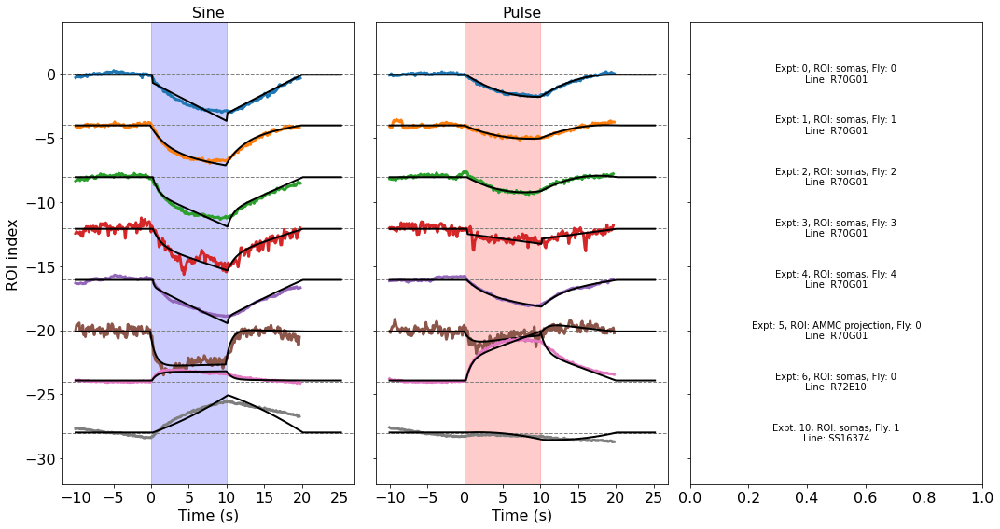

In [20]:
expt_ids_plot = [0, 1, 2, 3, 4, 5, 6, 10]
nroi_plot = len(expt_ids_plot)
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(15, nroi_plot), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids_plot):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    axs[0].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 4*cexpt, lw=3)
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 4*cexpt, lw=3)
    
    axs[2].text(0.5, -4*cexpt, f'Expt: {expt_id}, ROI: {roi}, Fly: {fly}\nLine: {line}', ha='center', va='center')
    
    # prediction
    ## sine response
    row_s = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 4*cexpt, lw=2, c='k')
    
    ## pulse response
    row_p = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 4*cexpt, lw=2, c='k')
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_ylim(-4*nroi_plot, 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)

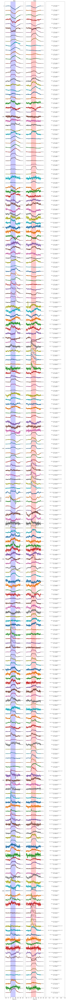

In [21]:
expt_ids_plot = range(len(df_param_lin))
nroi_plot = len(expt_ids_plot)
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(15, nroi_plot), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids_plot):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    axs[0].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 4*cexpt, lw=3)
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 4*cexpt, lw=3)
    
    axs[2].text(0.5, -4*cexpt, f'Expt: {expt_id}, ROI: {roi}, Fly: {fly}\nLine: {line}', ha='center', va='center')
    
    # prediction
    ## sine response
    row_s = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 4*cexpt, lw=2, c='k')
    
    ## pulse response
    row_p = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 4*cexpt, lw=2, c='k')
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_ylim(-4*nroi_plot, 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)

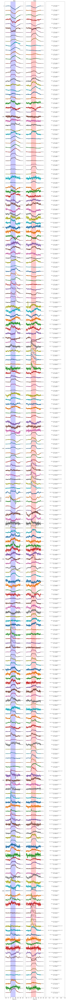

In [22]:
nroi_plot = 224
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(15, nroi_plot), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids[:nroi_plot]):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    axs[0].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 4*cexpt, lw=3)
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 4*cexpt, lw=3)
    
    axs[2].text(0.5, -4*cexpt, f'Expt: {expt_id}, ROI: {roi}, Fly: {fly}\nLine: {line}', ha='center', va='center')
    
    # prediction
    ## sine response
    row_s = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 4*cexpt, lw=2, c='k')
    
    ## pulse response
    row_p = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 4*cexpt, lw=2, c='k')
    
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_ylim(-4*nroi_plot, 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)

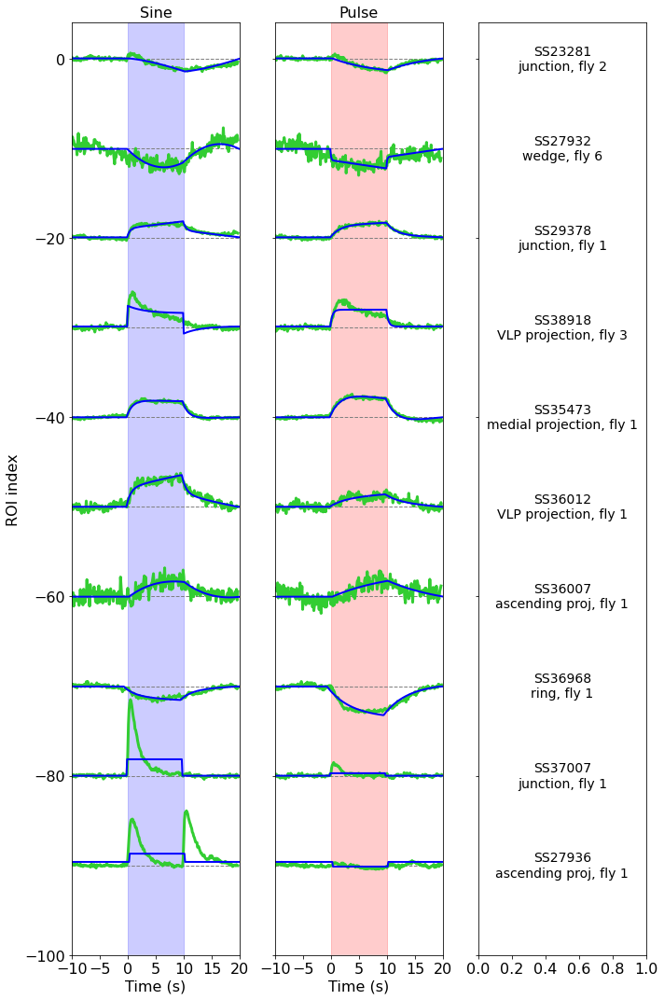

In [23]:
expt_ids_plot = [28, 46, 93, 148, 102, 126, 124, 132, 141, 66]
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(10, 1.5*len(expt_ids_plot)), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids_plot):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].axhline(-10*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 10*cexpt, lw=3, c='limegreen')
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-10*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 10*cexpt, lw=3, c='limegreen')
    
#     axs[2].text(0.5, -10*cexpt, f'Line: {line}\n{roi}, fly {fly+1}\n(Response {expt_id})', ha='center', va='center', fontsize=14)
    axs[2].text(0.5, -10*cexpt, f'{line}\n{roi}, fly {fly+1}', ha='center', va='center', fontsize=14)
    
    # prediction
    ## sine response
    row_s = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 10*cexpt, lw=2, c='b')
    
    ## pulse response
    row_p = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 10*cexpt, lw=2, c='b')
    
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_xlim(-10, 20)
    ax.set_ylim(-10*len(expt_ids_plot), 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)